In [22]:
# Импортируем сторонние библиотеки

import numpy as np
import matplotlib.pyplot as plt

In [23]:
# Функция, отвечающая за поиск оптимального значения Q

def Q_finder(omega_dr, F, n):
    min_osh = 100000
    Q_start = pow(10,-12)
    Q = Q_start
    Q_end = []
        
    for j in range (12):
        
        G = np.array([[0.], 
                  [0.],
                  [1]])  
    
       
        dxk = [np.array([[0], 
                         [0],
                         [0]])]

        Pk = [np.array([[0, 0, 0], 
                        [0, 0, 0],
                        [0, 0, 0]])]
        K = [0]
        dx = [np.array([[0], 
                        [0],
                        [0]])]
    
        P = [np.array([[0, 0, 0], 
                       [0, 0, 0],
                       [0, 0, 0]])]
        
        H = np.array([[0, 0, 1]]) 
            
        #print("Step {} start".format(j))
        osh = 0

        for k in range (1, n):
            
            dxk.append(np.dot(F, dx[k-1]))
            
            Pk.append(np.dot(np.dot(F, P[k-1]), np.transpose(F)) + (np.dot(np.dot(G,Q), np.transpose(G))))
            
            J = np.dot(Pk[k], np.transpose(H))
    
            U = np.dot(np.dot(H, Pk[k]), np.transpose(H)) + 0.01
    
            U = np.linalg.inv(U)
    
            K.append(np.dot(J, U))
        
            dx.append(dxk[k] + np.dot(K[k], (z[k - 1] - np.dot(H , dxk[k]))))
            
            P.append(np.dot((np.eye(3) - np.dot(K[k], H)), Pk[k]))
            
            sko = np.square(omega_dr[k][0] - (np.dot(H, dx[k])))[0][0]
                
            osh = osh + sko
            
        #print("Error ", osh, "  Min error", min_osh)
        
        #print("End of step {}, Q = {}".format(j, Q))
        Q_end.append(Q)
        Q = Q / 3
            
    return Q_end

In [24]:
# Функция отвечающая за вывод графиков
# data - список списков
# xlabel - обозначение оси X
# xlabel - обозначение оси Y

def plot(data, xlabel, ylabel):
    
    width = 20
    height = 12
    plt.figure(figsize=(width, height))
    
    for each in data:
        plt.plot(each)
        
    plt.xlabel(xlabel, fontsize = 30)
    plt.ylabel(ylabel, fontsize = 30)
    plt.xticks(fontsize = 20)
    plt.yticks(fontsize = 20)
    plt.show() 

In [25]:
# Исходные данные и постоянные

I = np.eye(3)                                                          # Единичная матрица
R = 6371000                                                            # Радиус Земли                  (м)                                
g = 9.8                                                                # Ускорение свободного падения  (м / (c)^2)
U = 15                                                                 # Скорость вращения Земли       (град / час)
omega_dr0 = 0.01                                                       # Дрейф гироскопа               (град / час)
time = 3 * 3600                                                        # Время моделирования           (с)
tao = 1                                                                # Шаг дескритизации             (с)
n = int(time / tao)                                                    # Число шагов дескритизации                    
Be = 0                                                                 # Дрейф акселерометров          

delta_Ve = [0]                                                         # Ошибка скорости по восточному каналу (массив)
delta_omega_n = [omega_dr0 * 3.14 / (3600 * 180)]                      # Ошибка дрейфа по северному каналу    (массив)
F_n = [0]                                                              # Ошибка угла крена                    (массив)                           

In [26]:
# Синтез случайных процессов

mu, sigma = 0, 1
W = np.random.normal(mu, sigma, pow(2,15))                     # Белый шум        (массив)

A = 5 * pow(10, -5)                                            # СКО случайного процесса
betta = 5 * pow(10, -8)                                        # Постоянная корреляции

wdr = [0]
for i in range (1, pow(2,15)):
    wdr.append((-betta * tao) * wdr[i - 1] + A * np.sqrt(2 * betta) * tao * W[i])

In [27]:
# Алгоритм одноканальной ИНС

for i in range(1,n):
    cdVe = delta_Ve[i - 1] - g * F_n[i - 1] + Be
    cF_n = F_n[i - 1] + delta_Ve[i - 1] / R + delta_omega_n[i - 1]
    cdomega_n = delta_omega_n[i - 1]
    
    delta_Ve.append(cdVe)
    F_n.append(cF_n)
    delta_omega_n.append(cdomega_n)

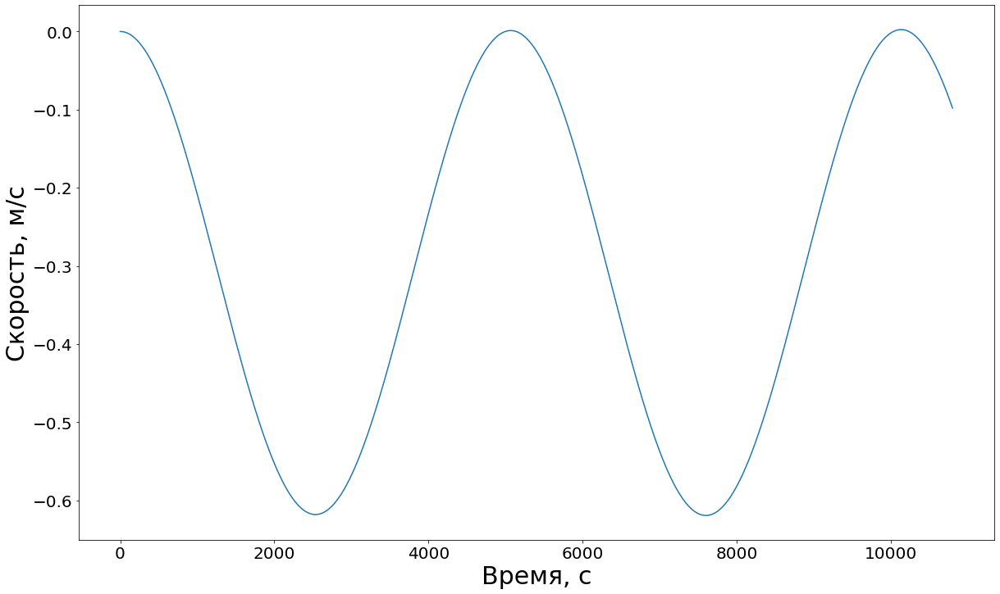

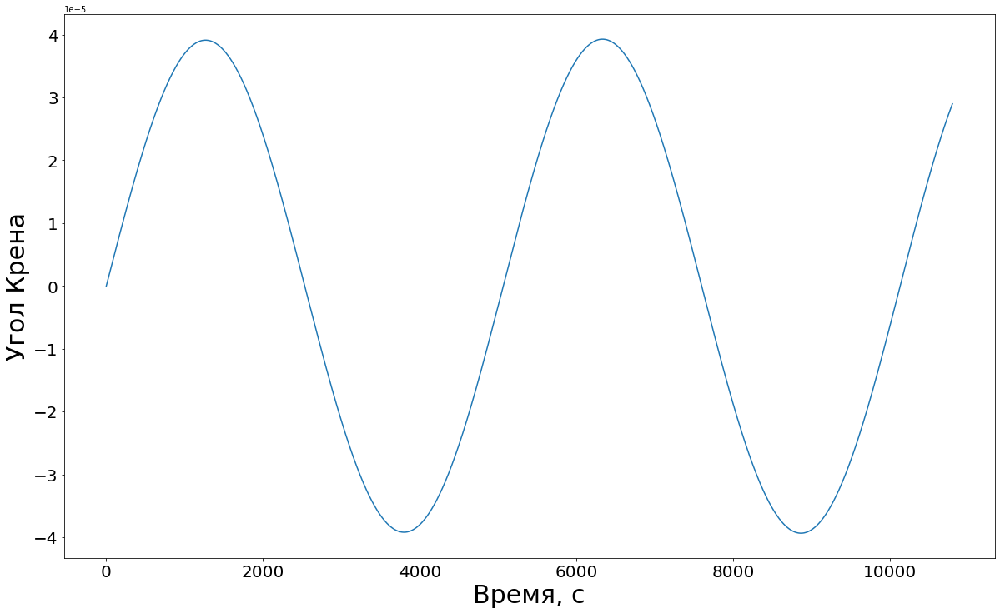

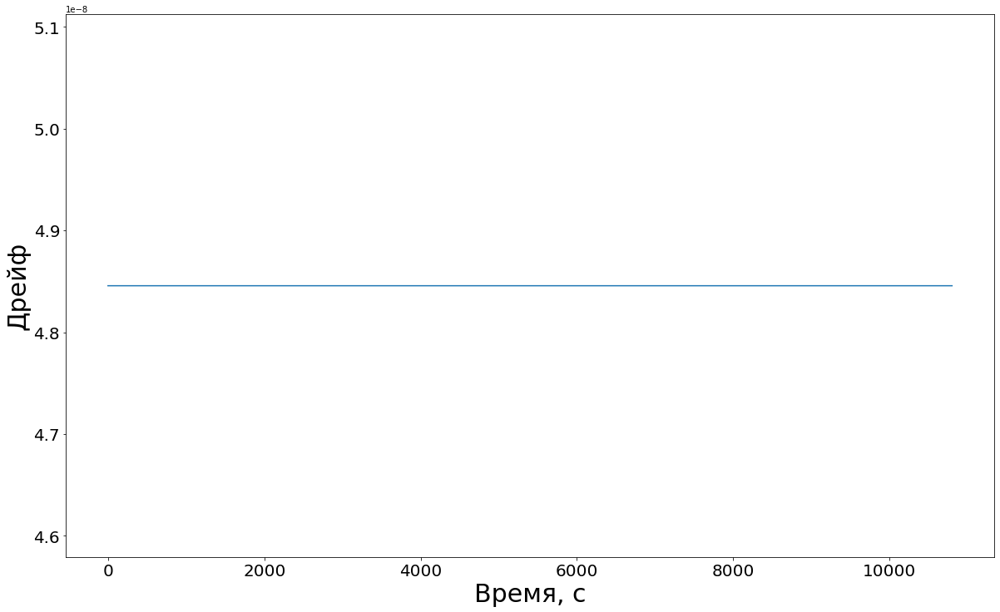

In [28]:
# Построение графиков

plot([delta_Ve], "Время, c", "Скорость, м/с")
plot([F_n], "Время, c", "Угол Крена")
plot([delta_omega_n], "Время, c", "Дрейф")

In [29]:
# Формирование вектора состояний(без шумов)

A1 = np.array([[0,  -g, 0],                             # Матрица система
               [1/R, 0, 1],
               [0,   0, 0]])

F = I + A1 * tao                                        # Матрица Ф

x = [np.array([[0], 
               [0],
               [delta_omega_n[0]]])]

# Подготавливаем массивы к посчету
delta_Ve = []
omega_dr = []
F_n = []


for i in range(1, n):
    x.append(np.dot(F , x[i - 1]))
    delta_Ve.append(x[i][0])
    F_n.append(x[i][1])
    omega_dr.append(x[i][2])

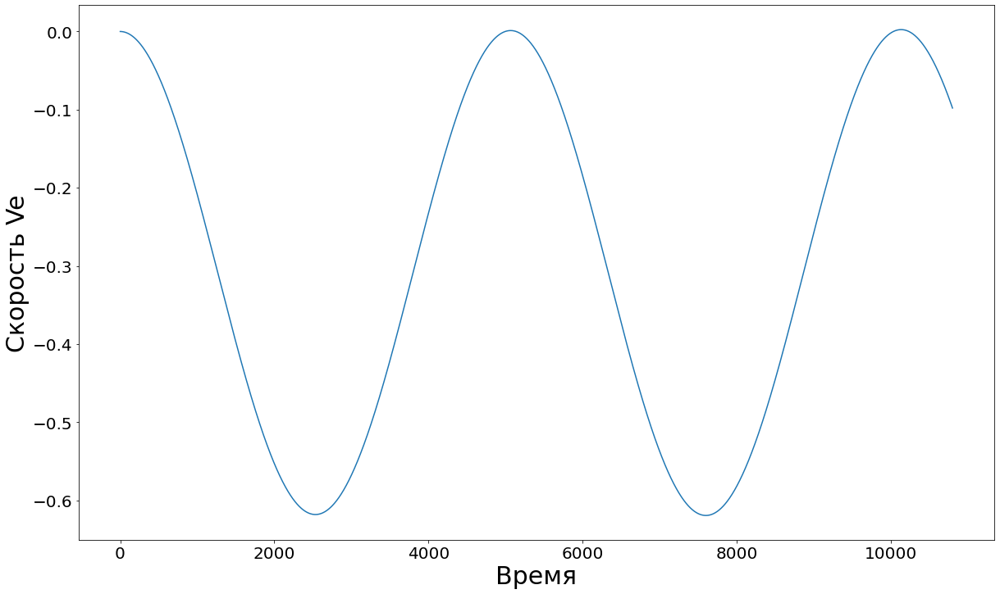

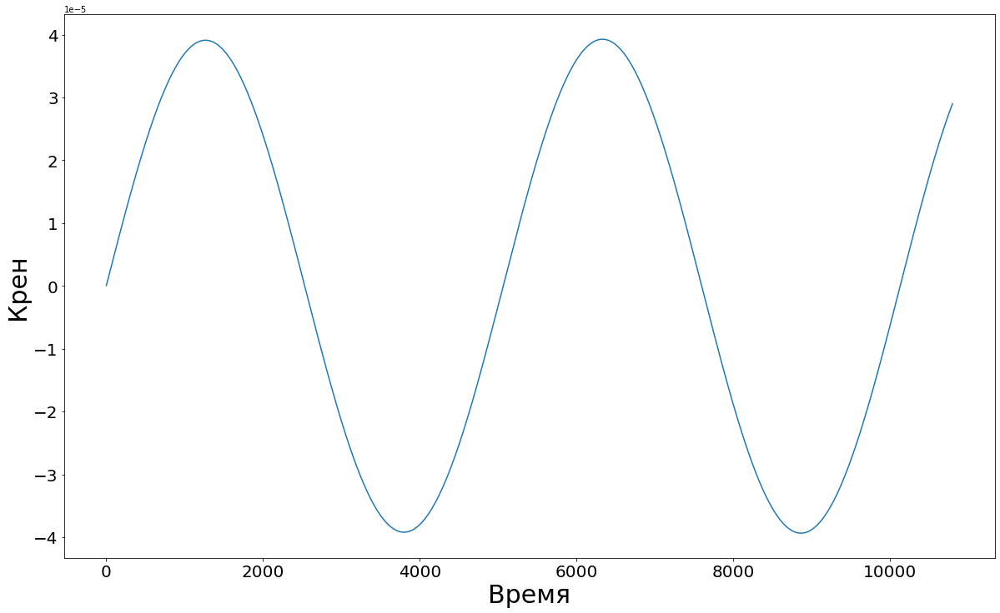

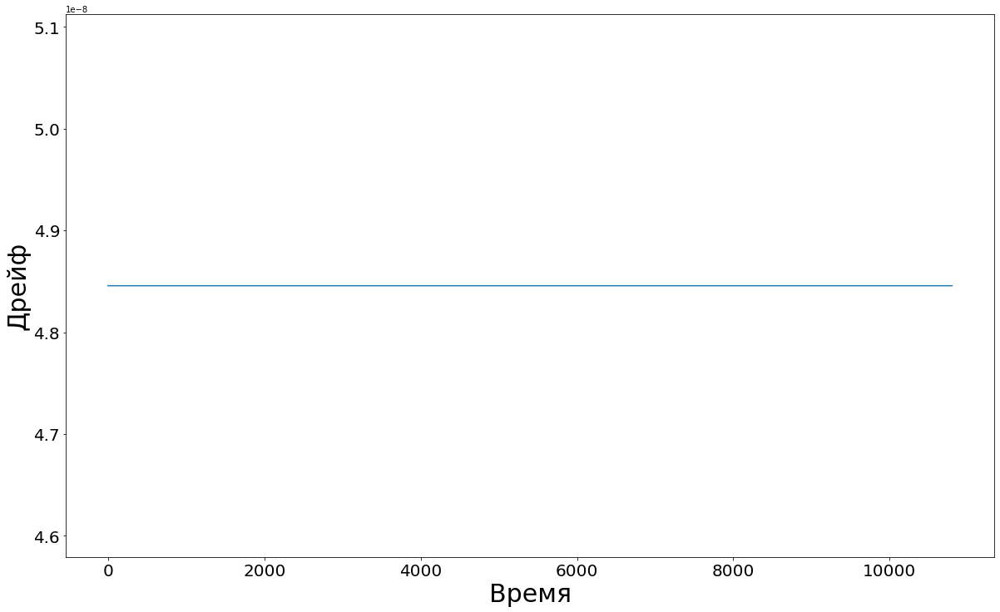

In [30]:
plot([delta_Ve], "Время", "Скорость Ve")
plot([F_n], "Время", "Крен")
plot([omega_dr], "Время", "Дрейф")

In [31]:
# Формирование вектора состояний(с шумами)

# Матрица перехода
F = np.array([[1,  -g, 0], 
              [1/R, 1, 1],
              [0,   0, 1 - betta]])


x = [np.array([[0], 
               [0],
               [delta_omega_n[0]]])]


# Входная матрица
G = np.array([[0.], 
               [0.],
               [A * np.sqrt(2 * betta)]])

# Подготавливаем массивы
delta_Ve = []
omega_dr = []
F_n =[]


# Алгоритм
for i in range(1, n):
    x.append(np.dot(F , x[i - 1] + G * W[i]))
    delta_Ve.append(x[i][0])
    F_n.append(x[i][1])
    omega_dr.append(x[i][2])

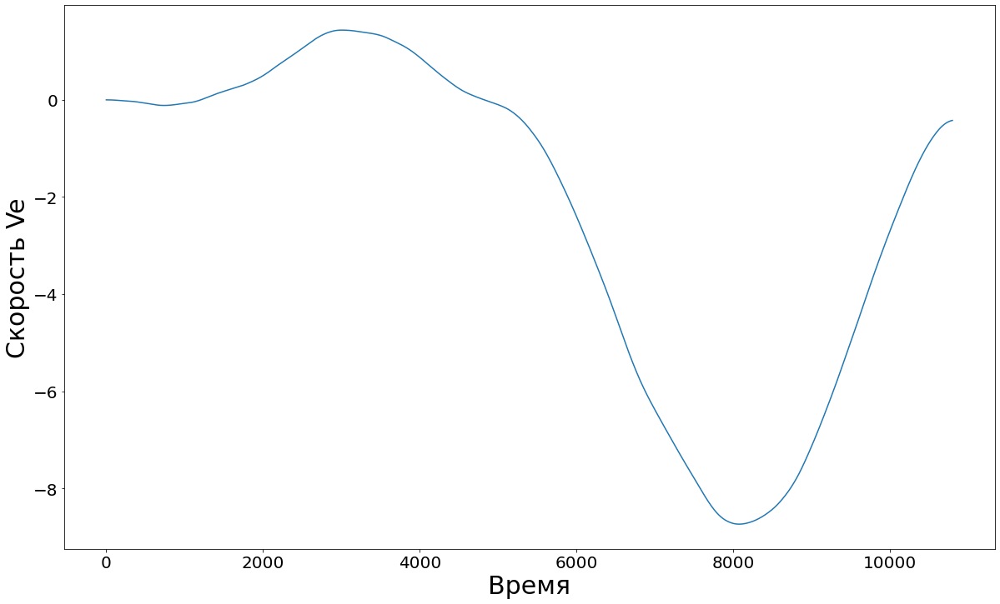

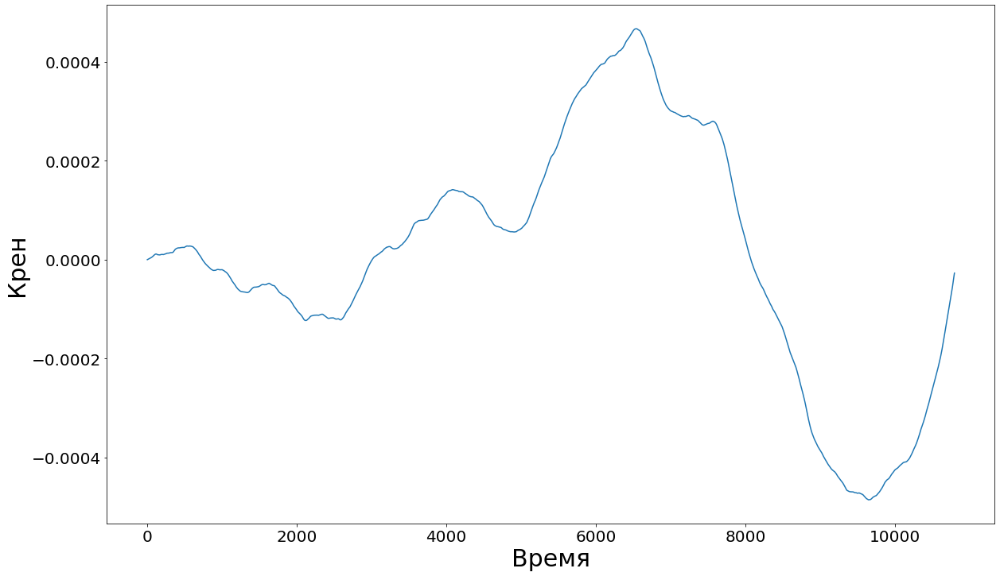

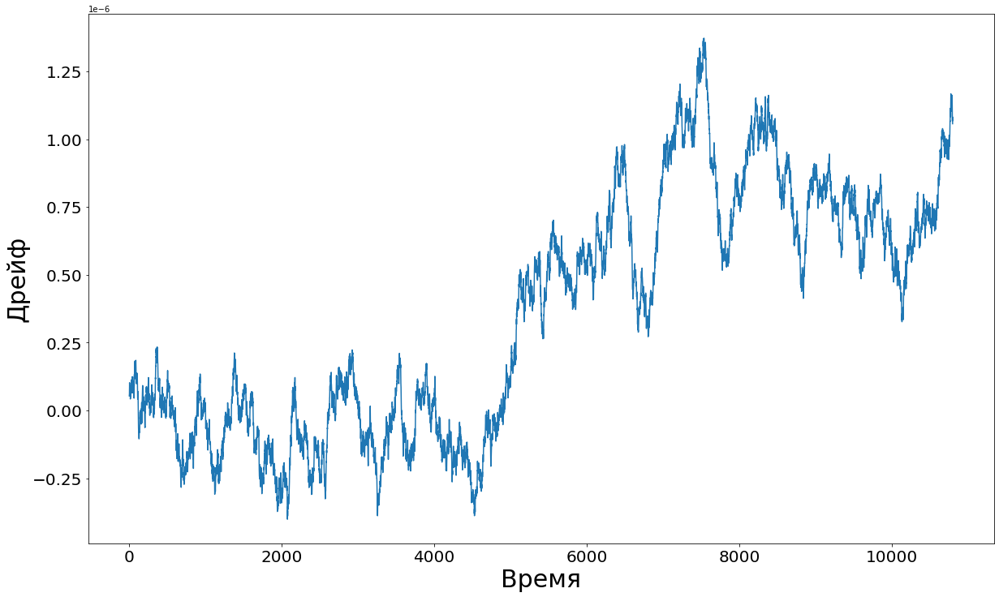

In [32]:
plot([delta_Ve], "Время", "Скорость Ve")
plot([F_n], "Время", "Крен")
plot([omega_dr], "Время", "Дрейф")

In [33]:
# Формирование вектора изменений

# Коэф. зашумленности GPS
D_Vgps1 = 0.2
D_Vgps2 = 0.02
D_Vgps3 = 0.002

# Массивы, в кот. будут записаны результаты 
z1 = []
z2 = []
z3 = []

# Генерация шума GPS
shum = np.random.normal(mu, sigma, pow(2,15))

# Рассчет
for i in range (n - 1):
    z1.append(delta_Ve[i] + shum[i] * np.sqrt(D_Vgps1))
    z2.append(delta_Ve[i] + shum[i] * np.sqrt(D_Vgps2))
    z3.append(delta_Ve[i] + shum[i] * np.sqrt(D_Vgps3))

z = z2

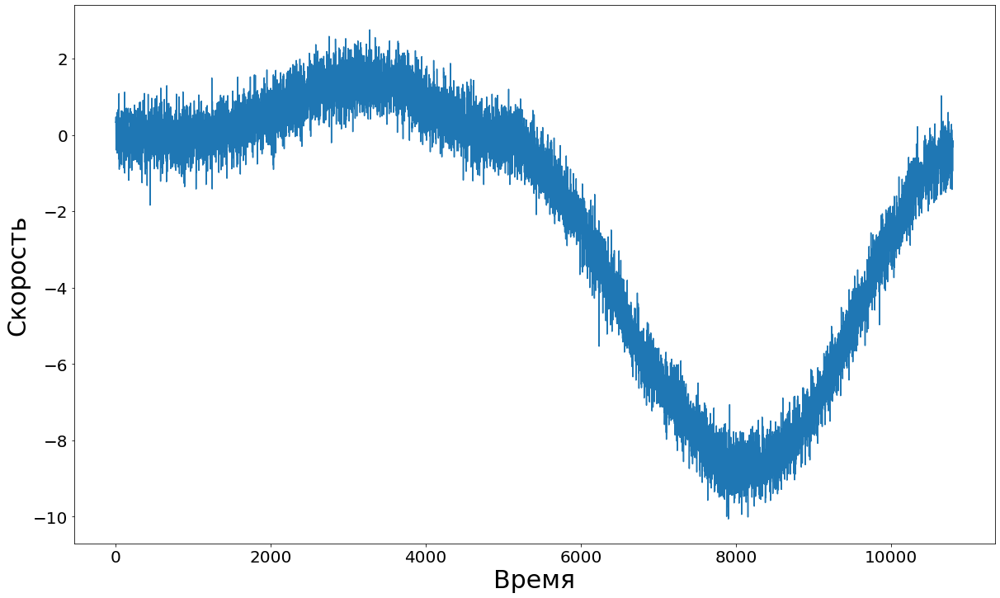

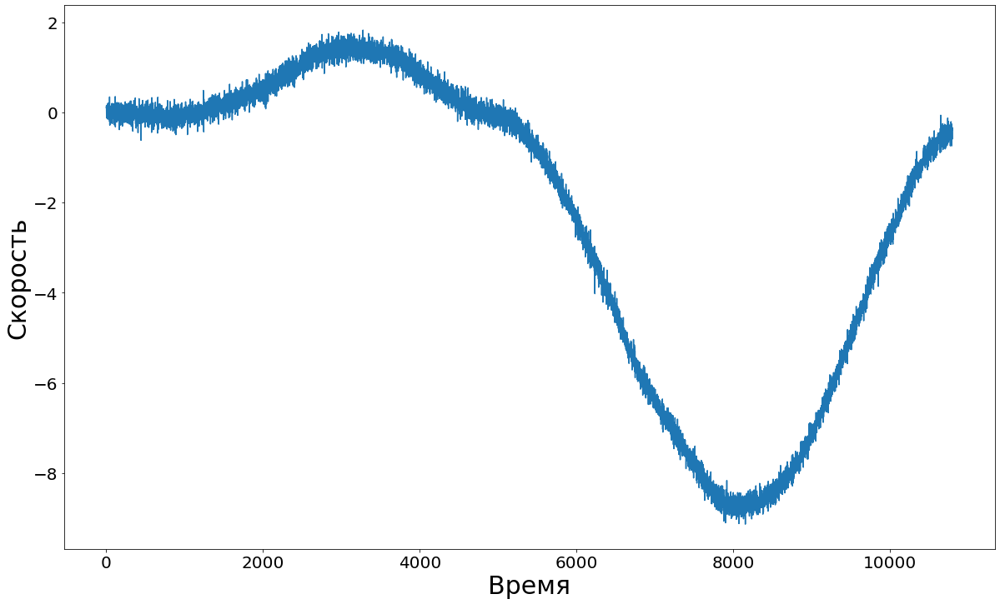

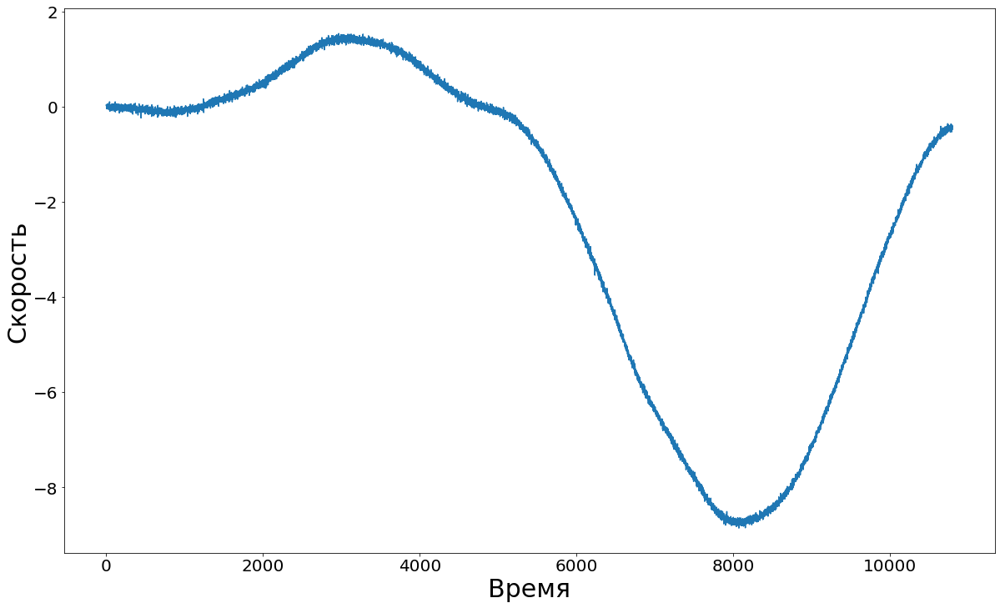

In [34]:
plot([z1],"Время", "Cкорость")
plot([z2],"Время", "Cкорость")
plot([z3],"Время", "Cкорость")

In [35]:
def Filter(Q):
    H = np.array([[1, 0, 0]])

    # Начальные условия
    ev_cur = [np.array([[0], 
                    [0],
                    [0]])]



    P_cur = [np.array([[0, 0, 0], 
                   [0, 0, 0],
                   [0, 0, 0]])]


    K = [0]
              
    ev_x = [np.array([[0], 
                  [0],
                  [0]])]
          
    
    P = [np.array([[0, 0, 0], 
               [0, 0, 0],
               [0, 0, 0]])]


    G = np.array([[0.], 
              [0.],
              [1]])               

            
              
    for i  in range(1,n):
    
    
        ev_cur.append(np.dot(F, ev_x[i - 1]))
    
    
        P_cur.append(np.dot(np.dot(F, P[i - 1]), np.transpose(F)) + (np.dot(np.dot(G,Q), np.transpose(G))))
    
    
        J = np.dot(P_cur[i], np.transpose(H))
    
        U = np.dot(np.dot(H, P_cur[i]), np.transpose(H)) + 0.01
    
        U = np.linalg.inv(U)
    
        K.append(np.dot(J, U))
    
    
        ev_x.append(ev_cur[i] + np.dot(K[i], (z[i - 1] - np.dot(H , ev_cur[i]))))
    
    
        P.append(np.dot((np.eye(3) - np.dot(K[i], H)), P_cur[i]))
    

    V = []
    KREN = []
    DREIF = []

    for i in range (n-1):
        V.append(ev_cur[i][0])
        KREN.append(ev_cur[i][1])
        DREIF.append(ev_cur[i][2])
    
    return DREIF, V

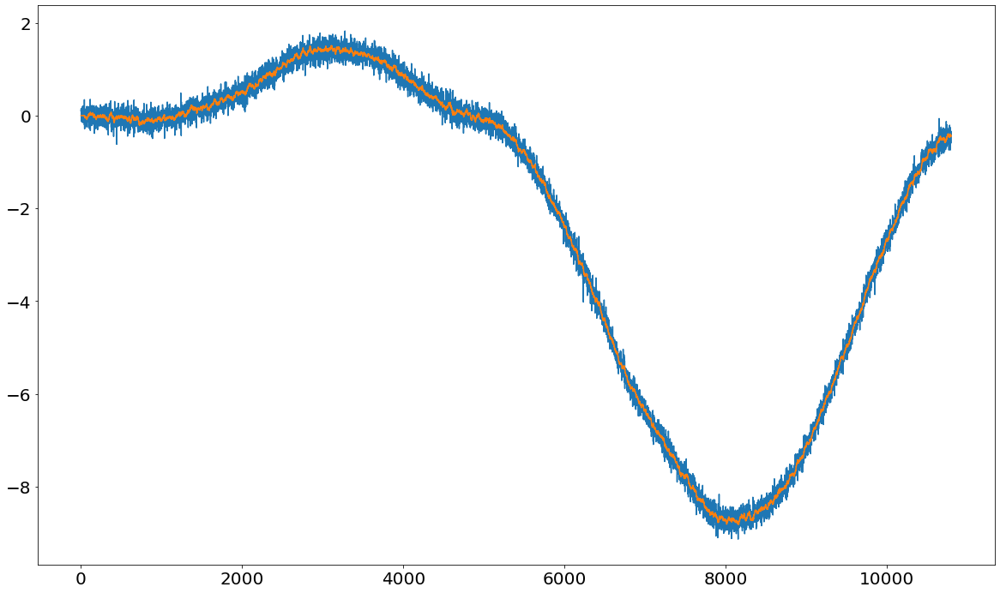

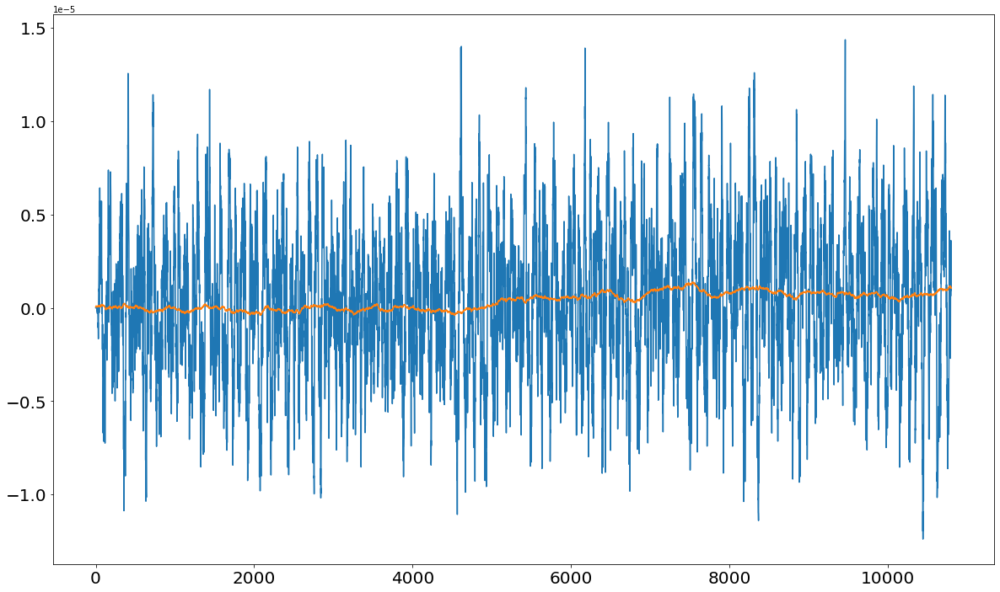

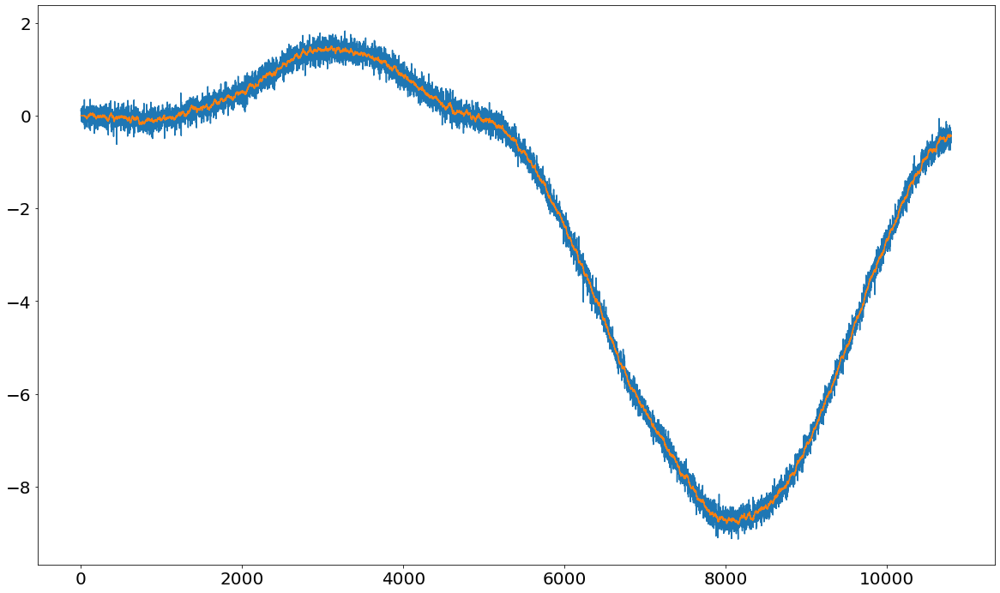

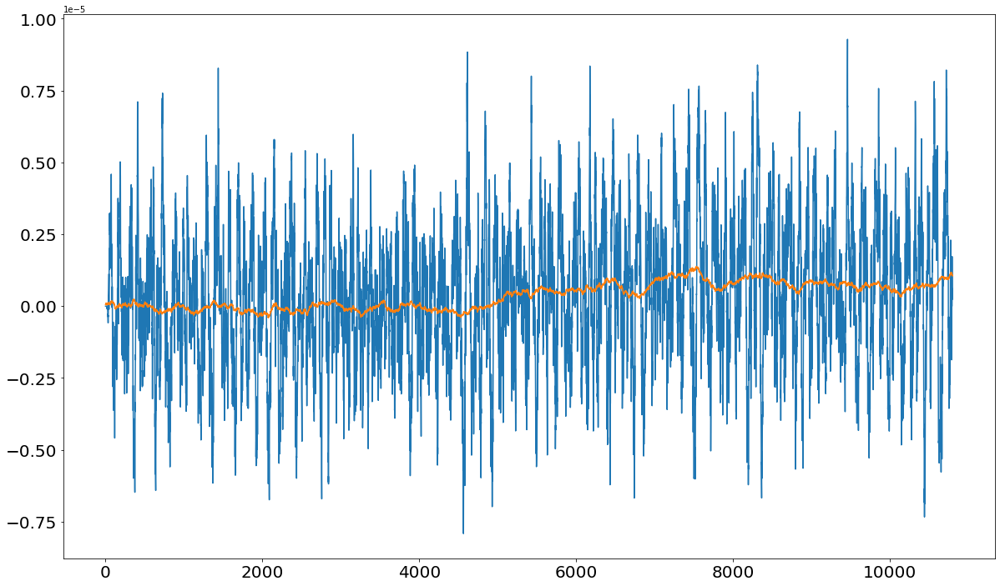

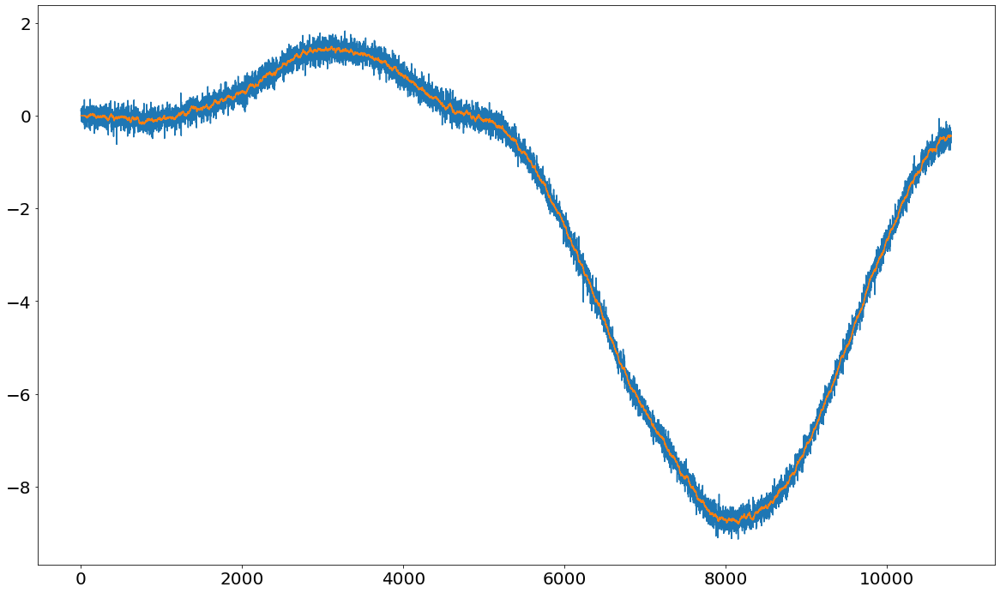

...

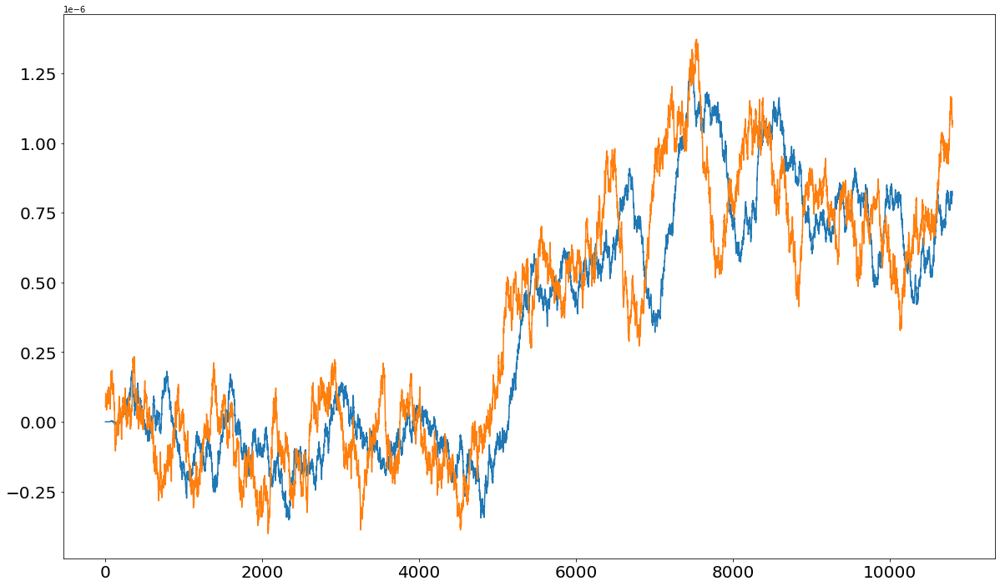

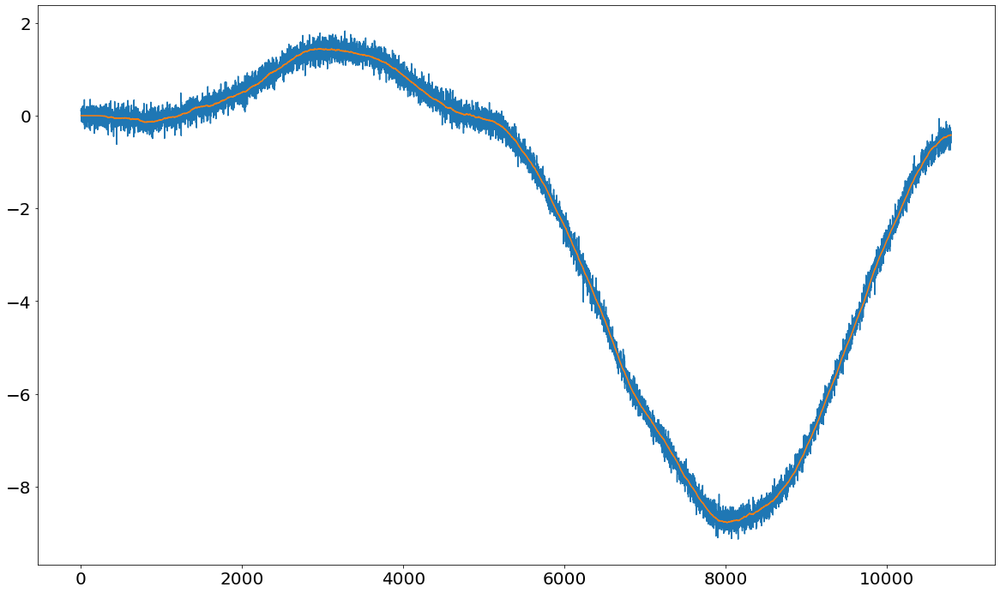

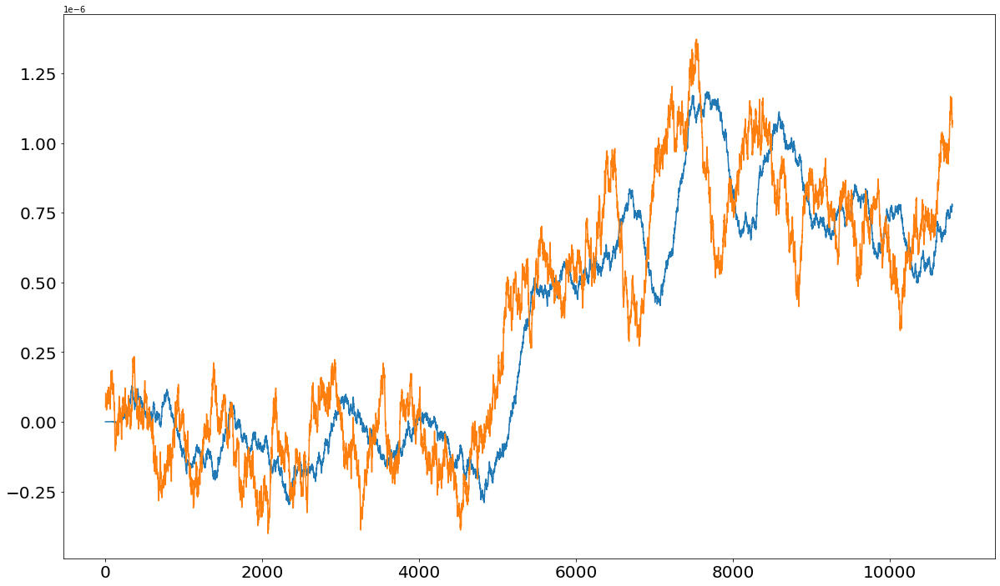

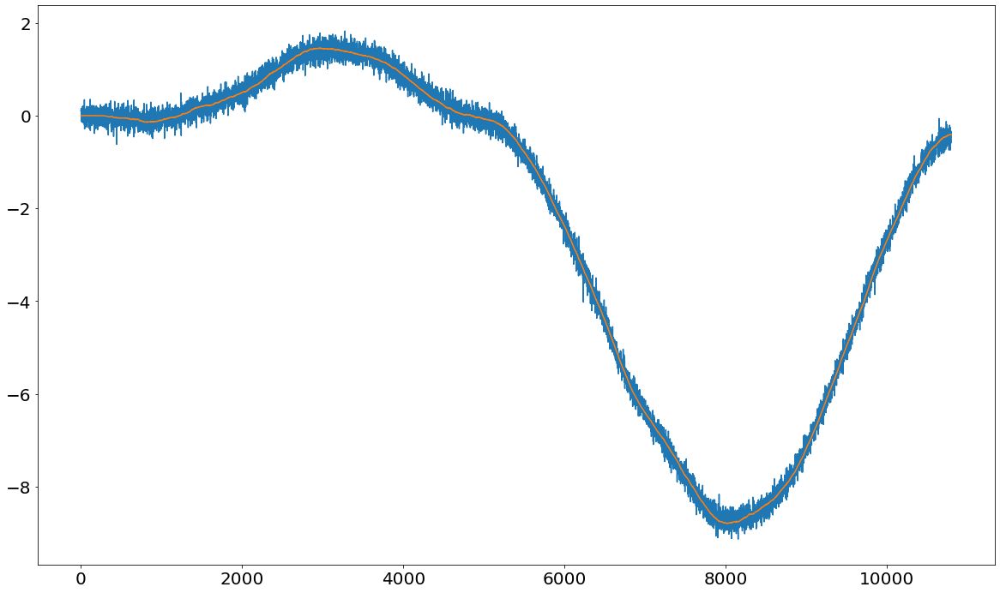

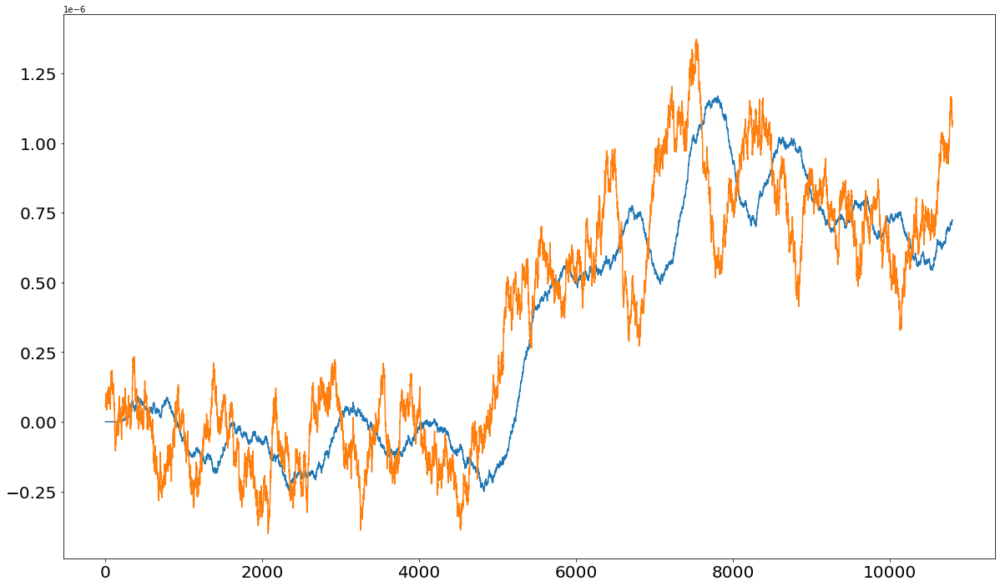

In [36]:
Q = Q_finder(omega_dr, F, n - 1)
for each in Q:
    DREIF, V = Filter(each)
    plot([z, V], "", "")
    plot([DREIF, omega_dr], "", "")
